# **Shoes price prediction**

# **Objective:**

**Predicting shoes price for the customers of Zshoes and deploy with the help of flask.**

# **Problem Statement:**

Zshoes.com is one of the famous shoe manufacturers of India and has business in
almost every country in Asia and Europe. They are one of the best choices of all the
athletics and they make the best shoes for running. Due to pandemic, they are facing a
loss as Zshoes are a bit expensive. They want to know the correct price of all types of
shoes that they are manufacturing so that they won’t face any loss and at the same
time customers also buy the shoes. As a machine learning engineer, we have to build a
shoe-price prediction app that can predict the correct shoe price by taking inputs like
freight_value,payment_type, etc.

# **Feature Details:**

order_item_id: Order id of the shoe.

price:price of the shoe(Target)

freight_value: freight_value of the shoe

payment_sequential: Sequence of payment

payment_type:types of payment

payment_installments: Installments of payments

payment_value:Value of payment

# **Import the libraries.**

In [36]:
!pip3 install catboost

In [37]:
from catboost import CatBoostClassifier

In [38]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

from nltk.classify.scikitlearn import SklearnClassifier
from statsmodels.stats.proportion import proportions_ztest
import string
import seaborn as sns
from nltk.sentiment.vader import SentimentIntensityAnalyzer

import random, re
import time
import plotly.express as px
from wordcloud import WordCloud, STOPWORDS

# used to supress display of warnings
import warnings


import missingno as mno

# nlp libraries
import nltk
nltk.download('punkt')
nltk.download('stopwords')

from nltk.tokenize import word_tokenize
from tqdm import tqdm
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
from sklearn.feature_extraction.text import TfidfVectorizer

import holoviews as hv
from holoviews import opts
from imblearn.over_sampling import SMOTE

import os;
from os import makedirs

# sampling methods
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE

# import zscore for scaling the data
from scipy.stats import zscore

from scipy.stats import randint as sp_randint

# save models
import pickle

# pre-processing methods
from sklearn.model_selection import train_test_split

# the classification models 
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeClassifier
from sklearn.linear_model import Lasso
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

# ensemble models
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from catboost import CatBoostClassifier
import catboost as cb
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

# methods and classes for evaluation
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold

from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, recall_score, precision_score, roc_auc_score

# cross-validation methods
from sklearn.model_selection import KFold
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# feature selection methods
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV

# pre-processing methods
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import LabelEncoder

# Deep learning libraries
from keras.utils import np_utils
from keras.utils.vis_utils import plot_model
from keras.layers import Input
from keras.layers.merge import Concatenate
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.models import Sequential
from tensorflow.keras import optimizers
from keras.models import Model
from tensorflow.keras.layers import Flatten, Activation, Dense, LSTM, BatchNormalization, Embedding, Dropout, Flatten, Bidirectional, GlobalMaxPool1D
from keras.models import model_from_json
from keras.regularizers import l1, l2, l1_l2
from keras.constraints import maxnorm, min_max_norm
from keras.constraints import unit_norm
from keras.callbacks import ReduceLROnPlateau
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from keras.models import model_from_json

from keras.models import load_model
from keras.wrappers.scikit_learn import KerasClassifier

# Keras pre-processing
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [39]:
os.environ['HV_DOC_HTML'] = 'true'

def _render(self, **kw):
  hv.extension('bokeh')
  return hv.Store.render(self)
hv.core.Dimensioned._repr_mimebundle_ = _render

In [40]:
os.environ['PYTHONHASHSEED']=str(7)

# Reproduce the results
def reset_random_seeds():
   os.environ['PYTHONHASHSEED']=str(7)
   #np.random.seed(7)
   #random.seed(7)
   tf.random.set_seed(7)

#random_state = 42
#np.random.seed(random_state)
#tf.random.set_seed(random_state)

!rm -R log/

rm: cannot remove 'log/': No such file or directory


In [41]:
# suppress display of warnings
warnings.filterwarnings('ignore')

# display all dataframe columns
pd.options.display.max_columns = None

# to set the limit to 3 decimals
pd.options.display.float_format = '{:.7f}'.format

# display all dataframe rows
pd.options.display.max_rows = None

In [42]:
from google.colab import drive
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# **Read the dataset(product_data.csv)**

In [43]:
data = pd.read_csv("/content/gdrive/MyDrive/product_data.csv")
data.head()

,order_item_id,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value
0,1,58.9000000,13.2900000,1,1,2,72.1900000
1,1,239.9000000,19.9300000,1,1,3,259.8300000
2,1,199.0000000,17.8700000,1,1,5,216.8700000
3,1,12.9900000,12.7900000,1,1,2,25.7800000
4,1,199.9000000,18.1400000,1,1,3,218.0400000


In [44]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101335 entries, 0 to 101334
Data columns (total 7 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_item_id         101335 non-null  int64  
 1   price                 101335 non-null  float64
 2   freight_value         101335 non-null  float64
 3   payment_sequential    101335 non-null  int64  
 4   payment_type          101335 non-null  int64  
 5   payment_installments  101335 non-null  int64  
 6   payment_value         101335 non-null  float64
dtypes: float64(3), int64(4)
memory usage: 5.4 MB


In [45]:
data.describe()

,order_item_id,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value
count,101335.0000000,101335.0000000,101335.0000000,101335.0000000,101335.0000000,101335.0000000,101335.0000000
mean,1.2052795,79.8183323,16.1267157,1.0894952,1.3520403,2.6717028,124.1245078
std,0.7152436,56.0579316,5.9432374,0.6891002,0.6523618,2.5243211,124.4180640
min,1.0000000,0.8500000,0.0000000,1.0000000,1.0000000,0.0000000,0.0000000
25%,1.0000000,35.9900000,12.6900000,1.0000000,1.0000000,1.0000000,55.5500000
50%,1.0000000,63.9000000,15.4700000,1.0000000,1.0000000,1.0000000,95.4000000
75%,1.0000000,109.9000000,18.6700000,1.0000000,2.0000000,3.0000000,155.8400000
max,21.0000000,270.0000000,36.0000000,26.0000000,4.0000000,24.0000000,3195.7300000


In [46]:
data.duplicated().sum()

25259

In [47]:
duplicates = data.duplicated()

data[duplicates]

,order_item_id,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value
443,1,99.9000000,0.0000000,1,2,1,99.9000000
665,1,39.9000000,15.1000000,1,1,5,55.0000000
838,1,99.0000000,13.7100000,1,1,4,112.7100000
890,1,49.0000000,7.7800000,1,1,2,56.7800000
913,1,19.9000000,15.1000000,1,1,1,35.0000000
922,1,31.9000000,16.7900000,1,2,1,48.6900000
971,1,29.9900000,7.7800000,1,1,1,37.7700000
995,1,99.9900000,11.9000000,1,1,3,111.8900000
1002,1,29.9000000,18.3100000,1,1,1,48.2100000
1095,1,14.0000000,7.3900000,1,1,1,21.3900000


In [48]:
# Delete duplicate rows
data.drop_duplicates(inplace=True)

In [49]:
data.isnull().sum()

order_item_id           0
price                   0
freight_value           0
payment_sequential      0
payment_type            0
payment_installments    0
payment_value           0
dtype: int64

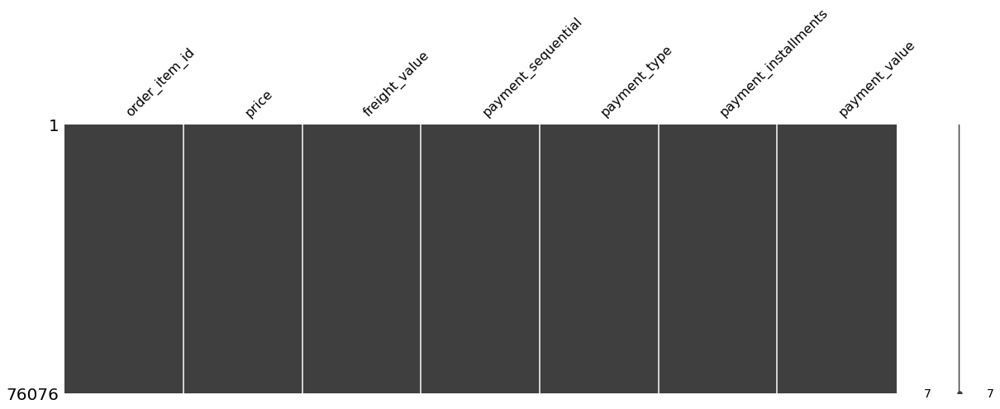

In [50]:
import missingno as mno
# Visualize missing values
mno.matrix(data, figsize = (20, 6));

In [51]:
data.shape

(76076, 7)

In [52]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 76076 entries, 0 to 101333
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   order_item_id         76076 non-null  int64  
 1   price                 76076 non-null  float64
 2   freight_value         76076 non-null  float64
 3   payment_sequential    76076 non-null  int64  
 4   payment_type          76076 non-null  int64  
 5   payment_installments  76076 non-null  int64  
 6   payment_value         76076 non-null  float64
dtypes: float64(3), int64(4)
memory usage: 4.6 MB


# **Put the price column in y and rest in X.**

In [53]:
X = data.drop("price",1)
y=data['price']

In [54]:
X.head()

,order_item_id,freight_value,payment_sequential,payment_type,payment_installments,payment_value
0,1,13.2900000,1,1,2,72.1900000
1,1,19.9300000,1,1,3,259.8300000
2,1,17.8700000,1,1,5,216.8700000
3,1,12.7900000,1,1,2,25.7800000
4,1,18.1400000,1,1,3,218.0400000


# **Perform relevant exploratory data analysis and write your inferences.**

In [55]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer


num_attributes = ['order_item_id', 'price', 'freight_value', 'payment_sequential', 'payment_installments', 
                  'payment_value']
cat_attributes = ['payment_type']

pipeline = ColumnTransformer([
        ('num', StandardScaler(), num_attributes),
        ('cat', OneHotEncoder(), cat_attributes),
])
df_prepared = pipeline.fit_transform(data)
df_prepared

array([[-0.32853835, -0.44152106, -0.52926682, ...,  0.        ,
         0.        ,  0.        ],
       [-0.32853835,  2.65201327,  0.54447309, ...,  0.        ,
         0.        ,  0.        ],
       [-0.32853835,  1.95297706,  0.21135498, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 2.13792276, -0.50817733,  2.85042657, ...,  1.        ,
         0.        ,  0.        ],
       [ 3.37115332, -0.50817733,  2.85042657, ...,  1.        ,
         0.        ,  0.        ],
       [-0.32853835, -0.49125689, -1.26827155, ...,  0.        ,
         0.        ,  0.        ]])

In [56]:
df_prepared.shape

(76076, 10)

In [57]:
from sklearn.decomposition import PCA

# Preserving 95% of the variance
pca = PCA(n_components=0.95)
df_reduced = pca.fit_transform(df_prepared)
df_reduced.shape

(76076, 6)

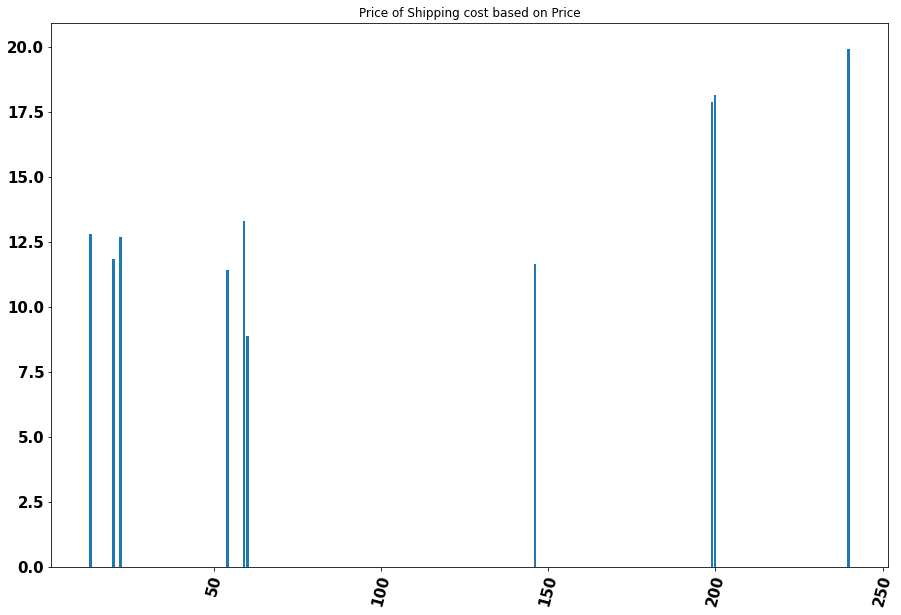

In [58]:
plt.figure(figsize=(15,10))
plt.bar(data['price'][:10], data['freight_value'][:10])
plt.title('Price of Shipping cost based on Price')
plt.xticks(rotation=75, fontsize=15, weight='bold')
plt.yticks(fontsize=15, weight='bold')
plt.show()

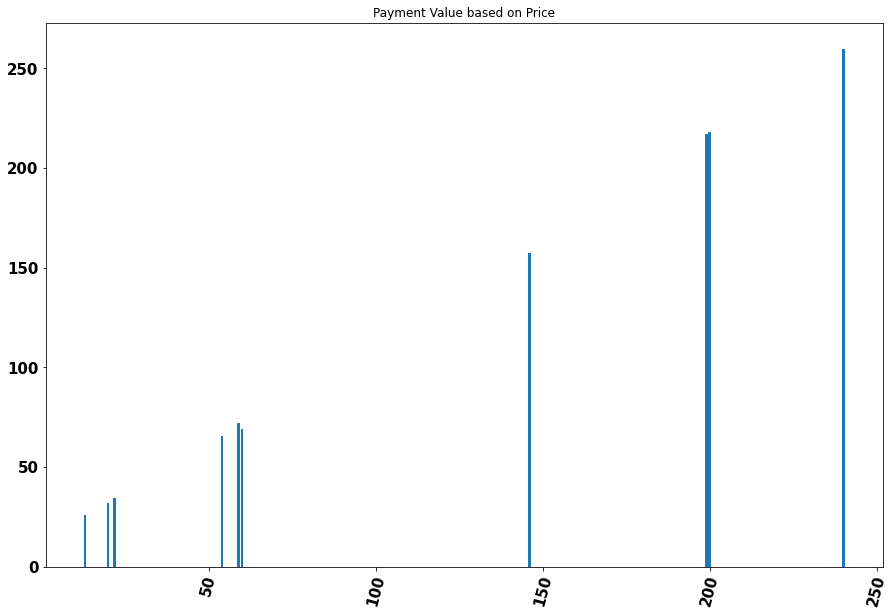

In [59]:
plt.figure(figsize=(15,10))
plt.bar(data['price'][:10], data['payment_value'][:10])
plt.title('Payment Value based on Price')
plt.xticks(rotation=75, fontsize=15, weight='bold')
plt.yticks(fontsize=15, weight='bold')
plt.show()

**Looks like the the Price and Payment values are directly proportional. The Payment value is increasing based on Price**

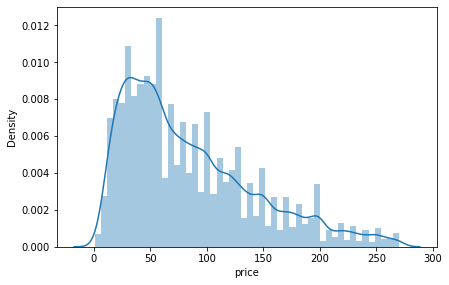

In [60]:
plt.figure(figsize = (15,15))
plt.subplot(3,2,1)
sns.distplot(data["price"])

**It looks like a lot of customers bought the shoes for 50$ and less there are not a lot of customers who bought the shoes that are very expensive**

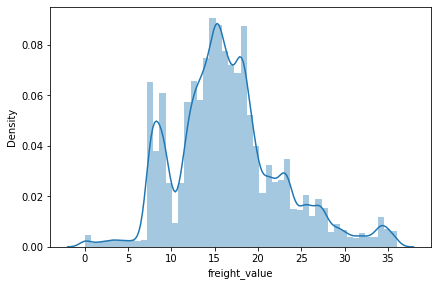

In [61]:
plt.figure(figsize = (15,15))
plt.subplot(3,2,1)
sns.distplot(data["freight_value"])

**The above graph depicts that the most common shipping cost is 15$ and it does look like it is positively skewed**

In [62]:
fig = px.pie(data, names='payment_type', template='seaborn')
fig.update_traces(rotation=90, pull=[0.2,0.03,0.1,0.03,0.1], textinfo="percent+label", showlegend=False)
fig.show()

**Looks like most customers took the Payment type options as 1 and there are very few that took the Payment option 4**

In [63]:
fig = px.pie(data, names='payment_installments', template='seaborn')
fig.update_traces(rotation=90, pull=[0.2,0.03,0.1,0.03,0.1], textinfo="percent+label", showlegend=False)
fig.show()

**Look like 49.2% of the customers paid the money in a single installment compared to the remaining customers**

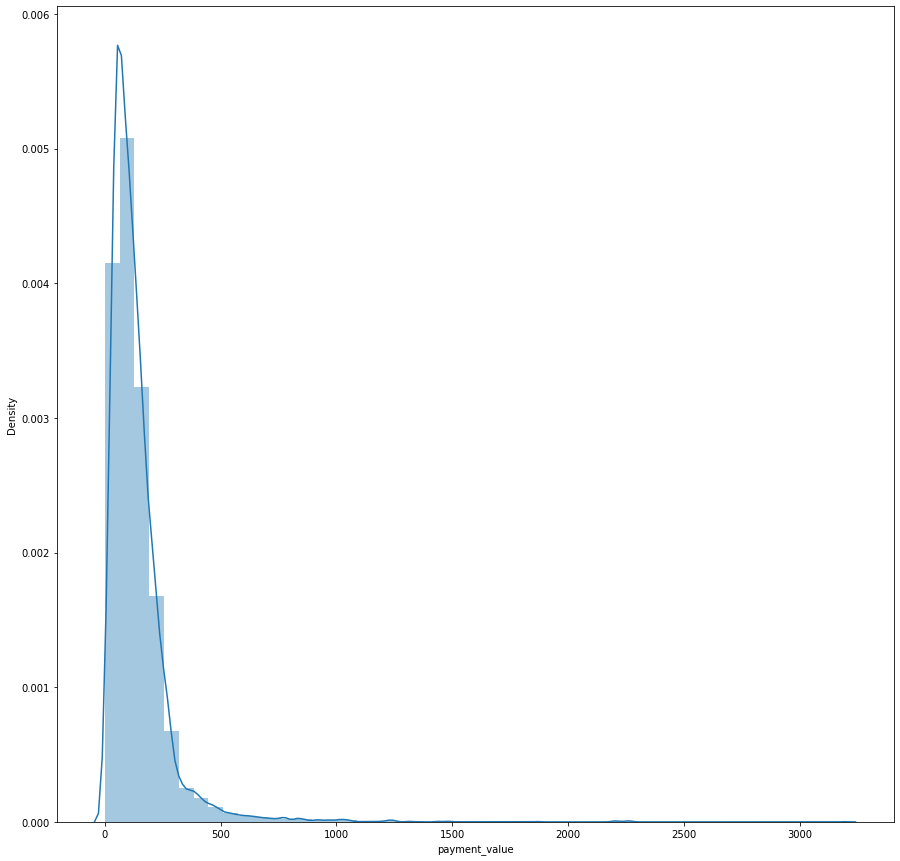

In [64]:
plt.figure(figsize = (15,15))
sns.distplot(data["payment_value"])

**Looks like most people have spent around 100 to 0 in an avg for buying shoes.**

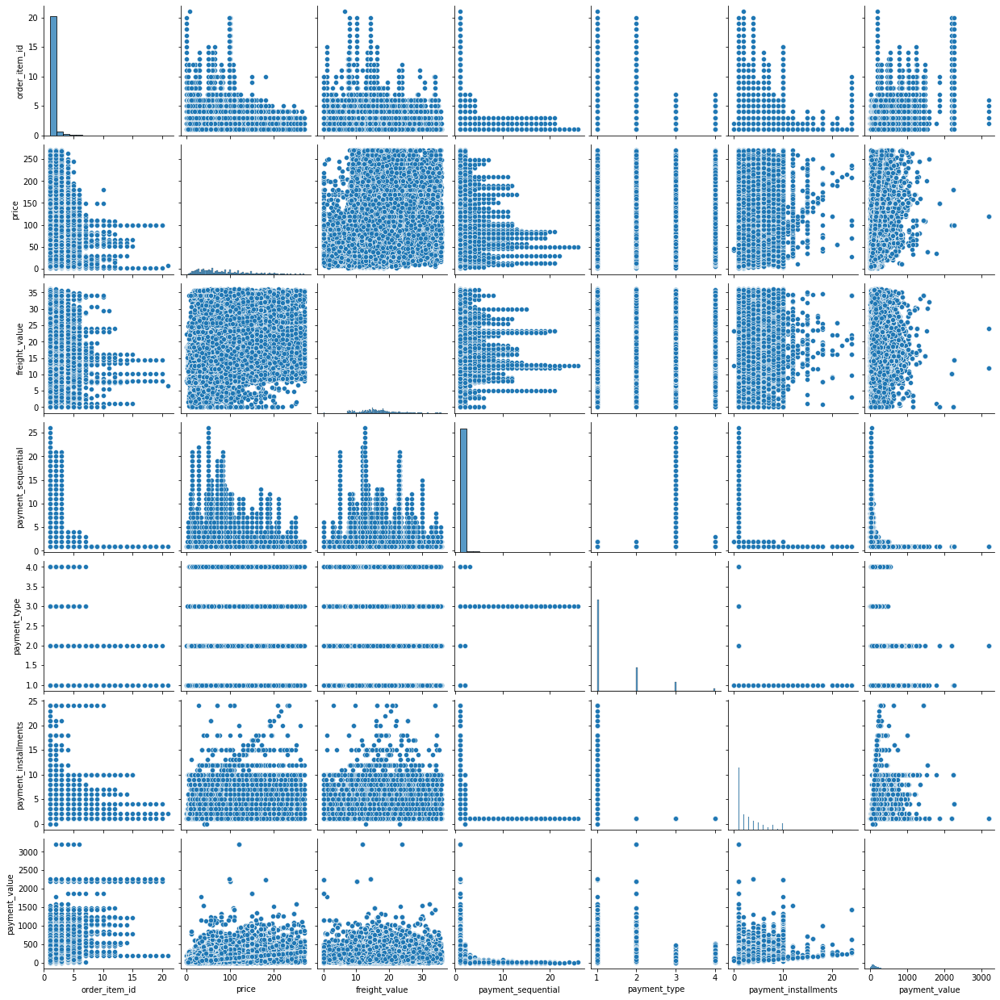

In [65]:
sns.pairplot(data, dropna=False)

**The above graph shows that there are multiple outliers which will mess up with the model performance**

In [66]:
num_cols = data[['price','payment_installments','freight_value','payment_value']]
for col in num_cols.columns:
  q1 = num_cols[col].quantile(0.25)
  q3 = num_cols[col].quantile(0.75)
  iqr = q3-q1
  ll = q1 - (1.5*iqr)
  ul = q3 + (1.5*iqr)
  for ind in data[col].index:
    if data.loc[ind,col] < ll :
      data.loc[ind,col] = ll
    elif data.loc[ind,col] > ul :
      data.loc[ind,col] = ul

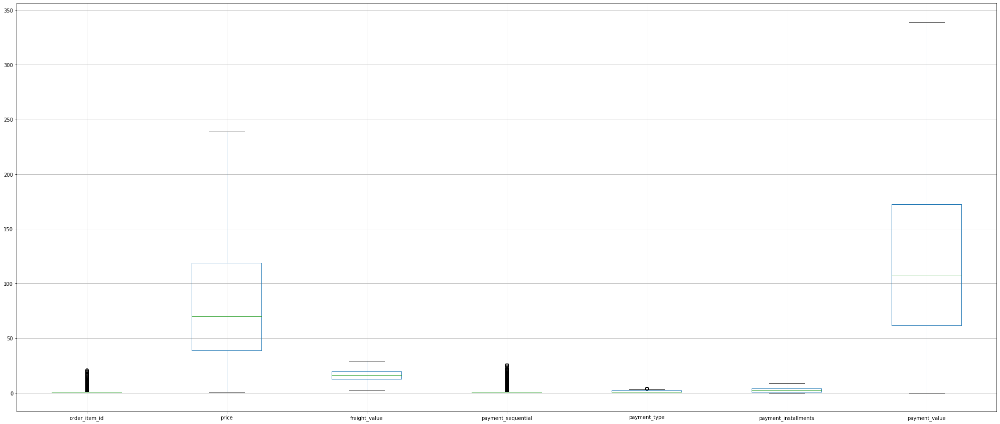

In [67]:
data.boxplot(figsize=(35,15)) #Again checking for outliers

In [68]:
# Check the Correlation
corr = data.corr()
corr

,order_item_id,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value
order_item_id,1.0000000,-0.1223437,-0.0837503,-0.0116982,-0.0115014,0.0763836,0.3633833
price,-0.1223437,1.0000000,0.2814586,-0.0274149,-0.0893159,0.2385044,0.6323473
freight_value,-0.0837503,0.2814586,1.0000000,0.0000770,-0.0333646,0.1129531,0.2181321
payment_sequential,-0.0116982,-0.0274149,0.0000770,1.0000000,0.3368826,-0.1087622,-0.1736186
payment_type,-0.0115014,-0.0893159,-0.0333646,0.3368826,1.0000000,-0.4064736,-0.1739522
payment_installments,0.0763836,0.2385044,0.1129531,-0.1087622,-0.4064736,1.0000000,0.3268026
payment_value,0.3633833,0.6323473,0.2181321,-0.1736186,-0.1739522,0.3268026,1.0000000


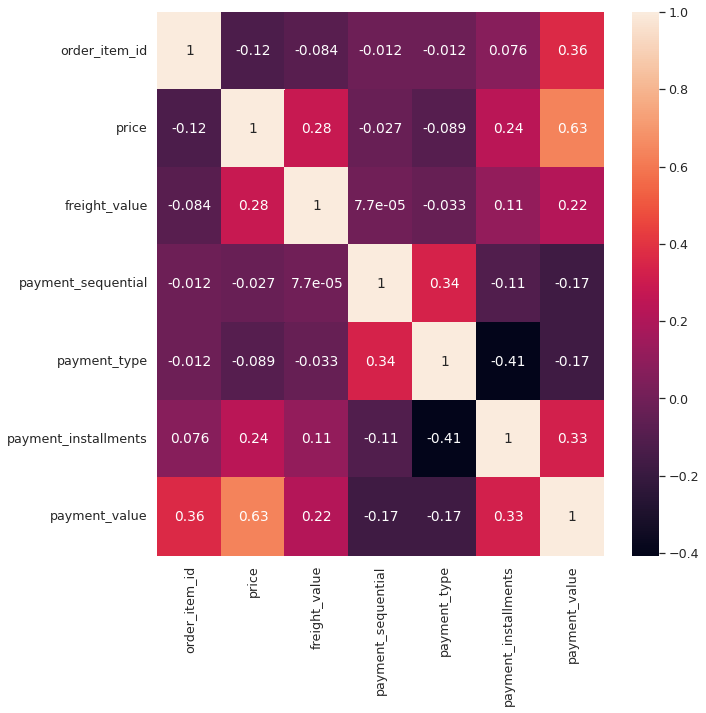

In [69]:
sns.set(font_scale=1.15)
fig,ax=plt.subplots(figsize=(10,10))
sns.heatmap(corr, annot=True)

# **Divide the dataset into train and test.**

In [70]:
from sklearn.model_selection import train_test_split

X = data.drop(['price'], axis=1)
y = data.price
X_train,X_valid,y_train,y_valid = train_test_split(X, y, test_size=0.2, random_state = 27)

In [71]:
from sklearn.preprocessing import OneHotEncoder

object_cols = ['freight_value', 'payment_type']
# Apply one-hot encoder to each column with categorical data
OH_encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
OH_cols_train = pd.DataFrame(OH_encoder.fit_transform(X_train[object_cols]))
OH_cols_valid = pd.DataFrame(OH_encoder.transform(X_valid[object_cols]))

# One-hot encoding removed index; put it back
OH_cols_train.index = X_train.index
OH_cols_valid.index = X_valid.index

# # Adding the column names after one hot encoding
OH_cols_train.columns = OH_encoder.get_feature_names(object_cols)
OH_cols_valid.columns = OH_encoder.get_feature_names(object_cols)

# Remove categorical columns (will replace with one-hot encoding)
num_X_train = X_train.drop(object_cols, axis=1)
num_X_valid = X_valid.drop(object_cols, axis=1)

# Add one-hot encoded columns to numerical features
X_train = pd.concat([num_X_train, OH_cols_train], axis=1)
X_valid = pd.concat([num_X_valid, OH_cols_valid], axis=1)

**Here we are converting all the train labels into Categorical Variables**

In [72]:
X_train.head()

order_item_id  payment_sequential  payment_installments  payment_value  \
1094               1                   1             1.0000000    190.0100000   
19270              1                   1             5.0000000     56.6100000   
64741              1                   1             1.0000000    258.6900000   
73107              2                   1             1.0000000     87.2000000   
58574              2                   1             1.0000000     73.3800000   

       freight_value_2.834999999999999  freight_value_2.84  \
1094                         0.0000000           0.0000000   
19270                        0.0000000           0.0000000   
64741                        0.0000000           0.0000000   
73107                        0.0000000           0.0000000   
58574                        0.0000000           0.0000000   

       freight_value_2.87  freight_value_2.88  freight_value_2.92  \
1094            0.0000000           0.0000000           0.0000000   
19270           0.0000000           0.0000000           0.0000000   
64741           0.0000000           0.0000000           0.0000000   
73107           0.0000000           0.0000000           0.0000000   
58574           0.0000000           0.0000000           0.0000000   

       freight_value_2.93  freight_value_2.94  freight_value_2.95  \
1094            0.0000000           0.0000000           0.0000000   
19270           0.0000000           0.0000000           0.0000000   
64741           0.0000000           0.0000000           0.0000000   
73107           0.0000000           0.0000000           0.0000000   
58574           0.0000000           0.0000000           0.0000000   

       freight_value_2.96  freight_value_2.97  freight_value_2.98  \
1094            0.0000000           0.0000000           0.0000000   
19270           0.0000000           0.0000000           0.0000000   
64741           0.0000000           0.0000000           0.0000000   
73107           0.0000000           0.0000000           0.0000000   
58574           0.0000000           0.0000000           0.0000000   

       freight_value_2.99  freight_value_3.02  freight_value_3.03  \
1094            0.0000000           0.0000000           0.0000000   
19270           0.0000000           0.0000000           0.0000000   
64741           0.0000000           0.0000000           0.0000000   
73107           0.0000000           0.0000000           0.0000000   
58574           0.0000000           0.0000000           0.0000000   

       freight_value_3.04  freight_value_3.05  freight_value_3.06  \
1094            0.0000000           0.0000000           0.0000000   
19270           0.0000000           0.0000000           0.0000000   
64741           0.0000000           0.0000000           0.0000000   
73107           0.0000000           0.0000000           0.0000000   
58574           0.0000000           0.0000000           0.0000000   

       freight_value_3.07  freight_value_3.08  freight_value_3.09  \
1094            0.0000000           0.0000000           0.0000000   
19270           0.0000000           0.0000000           0.0000000   
64741           0.0000000           0.0000000           0.0000000   
73107           0.0000000           0.0000000           0.0000000   
58574           0.0000000           0.0000000           0.0000000   

       freight_value_3.1  freight_value_3.11  freight_value_3.12  \
1094           0.0000000           0.0000000           0.0000000   
19270          0.0000000           0.0000000           0.0000000   
64741          0.0000000           0.0000000           0.0000000   
73107          0.0000000           0.0000000           0.0000000   
58574          0.0000000           0.0000000           0.0000000   

       freight_value_3.13  freight_value_3.14  freight_value_3.15  \
1094            0.0000000           0.0000000           0.0000000   
19270           0.0000000           0.0000000           0.0000000   
64741           0.0000000           0.000

In [73]:
X_train.shape

(60860, 2480)

In [74]:
X_valid.head()

order_item_id  payment_sequential  payment_installments  payment_value  \
54753              1                   1             8.5000000     90.5500000   
28086              3                   1             1.0000000    122.7300000   
95808              3                   1             2.0000000     73.1200000   
69845              1                   1             3.0000000    145.0100000   
17868              1                   1             1.0000000     98.8200000   

       freight_value_2.834999999999999  freight_value_2.84  \
54753                        0.0000000           0.0000000   
28086                        0.0000000           0.0000000   
95808                        0.0000000           0.0000000   
69845                        0.0000000           0.0000000   
17868                        0.0000000           0.0000000   

       freight_value_2.87  freight_value_2.88  freight_value_2.92  \
54753           0.0000000           0.0000000           0.0000000   
28086           0.0000000           0.0000000           0.0000000   
95808           0.0000000           0.0000000           0.0000000   
69845           0.0000000           0.0000000           0.0000000   
17868           0.0000000           0.0000000           0.0000000   

       freight_value_2.93  freight_value_2.94  freight_value_2.95  \
54753           0.0000000           0.0000000           0.0000000   
28086           0.0000000           0.0000000           0.0000000   
95808           0.0000000           0.0000000           0.0000000   
69845           0.0000000           0.0000000           0.0000000   
17868           0.0000000           0.0000000           0.0000000   

       freight_value_2.96  freight_value_2.97  freight_value_2.98  \
54753           0.0000000           0.0000000           0.0000000   
28086           0.0000000           0.0000000           0.0000000   
95808           0.0000000           0.0000000           0.0000000   
69845           0.0000000           0.0000000           0.0000000   
17868           0.0000000           0.0000000           0.0000000   

       freight_value_2.99  freight_value_3.02  freight_value_3.03  \
54753           0.0000000           0.0000000           0.0000000   
28086           0.0000000           0.0000000           0.0000000   
95808           0.0000000           0.0000000           0.0000000   
69845           0.0000000           0.0000000           0.0000000   
17868           0.0000000           0.0000000           0.0000000   

       freight_value_3.04  freight_value_3.05  freight_value_3.06  \
54753           0.0000000           0.0000000           0.0000000   
28086           0.0000000           0.0000000           0.0000000   
95808           0.0000000           0.0000000           0.0000000   
69845           0.0000000           0.0000000           0.0000000   
17868           0.0000000           0.0000000           0.0000000   

       freight_value_3.07  freight_value_3.08  freight_value_3.09  \
54753           0.0000000           0.0000000           0.0000000   
28086           0.0000000           0.0000000           0.0000000   
95808           0.0000000           0.0000000           0.0000000   
69845           0.0000000           0.0000000           0.0000000   
17868           0.0000000           0.0000000           0.0000000   

       freight_value_3.1  freight_value_3.11  freight_value_3.12  \
54753          0.0000000           0.0000000           0.0000000   
28086          0.0000000           0.0000000           0.0000000   
95808          0.0000000           0.0000000           0.0000000   
69845          0.0000000           0.0000000           0.0000000   
17868          0.0000000           0.0000000           0.0000000   

       freight_value_3.13  freight_value_3.14  freight_value_3.15  \
54753           0.0000000           0.0000000           0.0000000   
28086           0.0000000           0.0000000           0.0000000   
95808           0.0000000           0.000

# **Train a suitable model and evaluate it using appropriate metrics.**

In [75]:
# Importing models
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.tree import DecisionTreeRegressor

In [76]:
from sklearn.pipeline import Pipeline
# Decision Tree Regression Pipeline
pipeline_dtr=Pipeline([('dtr', DecisionTreeRegressor(random_state=27))])

# Random Forest Pipeline
pipeline_randomforest=Pipeline([('rf_regressor',RandomForestRegressor(random_state=27))])

# XGBost Pipeline
pipeline_xgb=Pipeline([('xgb_regressor',xgb.XGBRegressor(objective="reg:linear", random_state=27))])

In [ ]:
# Creating a list of the pipelines to loop through them
pipelines = [pipeline_dtr, pipeline_xgb, pipeline_randomforest]

best_accuracy=0.0
best_regressor=0
best_pipeline=""

# Dictionary of pipelines and regression types for ease of reference
pipe_dict = {0: 'DTR', 1: 'XGBoost', 2: 'RandomForest'}

# Fit the pipelines
for pipe in pipelines:
	pipe.fit(X_train, y_train)

from sklearn.metrics import accuracy_score
# Checking the accuracy of each model
for i,model in enumerate(pipelines):
    print("{} Test Accuracy: {}".format(pipe_dict[i],model.score(X_valid,y_valid)))

# Finding the best model
for i,model in enumerate(pipelines):
    if model.score(X_valid,y_valid)>best_accuracy:
        best_accuracy=model.score(X_valid,y_valid)
        best_pipeline=model
        best_regressor=i
print('Model with best accuracy: {}'.format(pipe_dict[best_regressor]))

[14:01:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from pprint import pprint

In [ ]:
# Using Randomized Search CV to find the best parameters

# Number of trees in random forest
n_estimators = [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None]
# max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 15, 25, 50, 75, 100]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 5, 10]
# Method of selecting samples for training each tree
# bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

pprint(random_grid)

In [ ]:
rf = RandomForestRegressor(random_state=27)
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 10, cv = 3, verbose=2, random_state=27, n_jobs = -1)

# Fit the random search model

rf_random.fit(X_train, y_train)

In [ ]:
# Evaluation of Random Search
def evaluate(model, X_valid, y_valid):
    predictions = model.predict(X_valid)
    errors = np.sqrt(mean_squared_error(y_valid, predictions))
    print('Model Performance')
    print('MSE of: ', errors)
    
    return errors

In [ ]:
from sklearn.metrics import mean_squared_error
base_model = rf
base_model.fit(X_train, y_train)
base_accuracy = evaluate(base_model, X_valid, y_valid)


best_random = rf_random.best_estimator_
best_random.fit(X_train , y_train)

random_accuracy = evaluate(best_random, X_valid, y_valid)

print('\n')
print('Base Model Error: ', base_accuracy)
print('\n')
print('Improved Model Error: ', random_accuracy)
print('Improvement of {:0.2f}%.'.format((random_accuracy - base_accuracy) / base_accuracy))

print('\n')
print('RF_Randomized_Search_CV is complete.')
print('\n')

In [ ]:
print('The best model is',rf_random.best_estimator_)

In [ ]:
print('The accuracy of this model is', rf_random.best_score_*100 + '%')

In [ ]:
rom sklearn.model_selection import cross_val_score

# Multiply by -1 since sklearn calculates *negative* MAE
scores = -1 * cross_val_score(best_random, X_valid, y_valid,
                              cv=5,
                              scoring='neg_mean_absolute_error')

print("MAE scores:\n", scores)
print("Average MAE score (across experiments):\n")
print(scores.mean())

# **Save the best performing model.**

In [ ]:
# Saving model to disk
import pickle
pickle.dump(best_random, open('model.pkl','wb'))

# Loading model to compare the results
model = pickle.load(open('model.pkl','rb'))

# Loading model to compare the results
model = pickle.load(open('model.pkl','rb'))